In [1]:
from diffusers import AutoencoderKL
from sklearn.manifold import TSNE
import numpy as np
import os
import sys
sys.path.append('../')

import torch
from torch.utils.data import DataLoader
from torchvision import datasets, transforms
from pm.dataset.dataloader import get_data_loaders
import numpy as np
import matplotlib.pyplot as plt
import torch.nn as nn
import torch.optim as optim
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [2]:
train_loader, test_loader, val_loader = get_data_loaders(base_path='../data', name='all', batch_size=16)

In [3]:
train_images, train_labels = next(iter(train_loader))
test_images, test_labels = next(iter(test_loader))
val_images, val_labels = next(iter(val_loader))

In [4]:
CLASS_NAMES = ['Cezanne','Degas','Gaunuin','Hassam','Matisse','Monet','Pissarro','Renoir','Sargent','VanGogh']

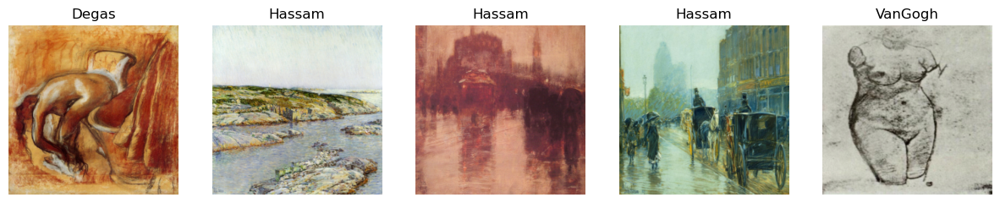

In [5]:
def denormalize(tensor):
    return tensor * 0.5 + 0.5


fig, axes = plt.subplots(1, 5, figsize=(15, 3))
for i, ax in enumerate(axes):
    img = denormalize(train_images[i]).permute(1, 2, 0).numpy()
    ax.imshow(img)
    ax.set_title(train_labels[i])
    ax.axis('off')
plt.show()

In [6]:
autoencoder = AutoencoderKL.from_pretrained("stabilityai/sd-vae-ft-mse").to(device)
latent_dim=16
weight_decay=1e-4
lr=1e-5
l1_reg=1e-1
criterion = nn.MSELoss()
optimizer = optim.Adam(autoencoder.parameters(),weight_decay=weight_decay, lr=lr)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


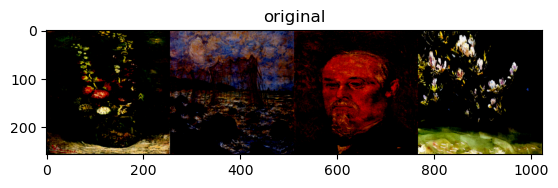

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


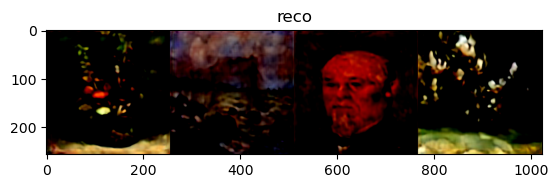

Epoch [1/10], Train Loss: 0.1263, Val Loss: 0.0423, Reg:0.1


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


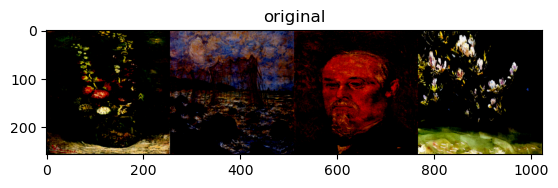

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


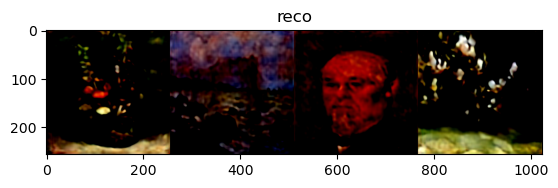

Epoch [2/10], Train Loss: 0.0348, Val Loss: 0.0294, Reg:0.1


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


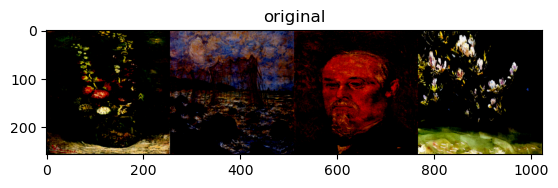

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


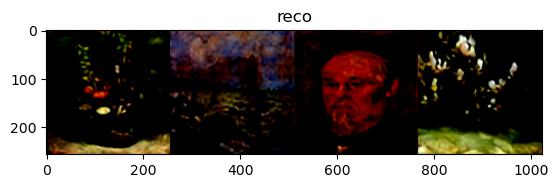

Epoch [3/10], Train Loss: 0.0285, Val Loss: 0.0262, Reg:0.1


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


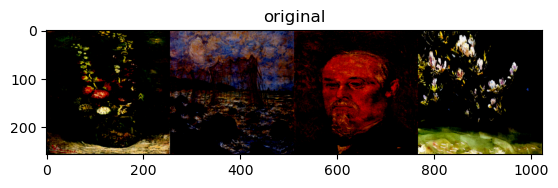

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


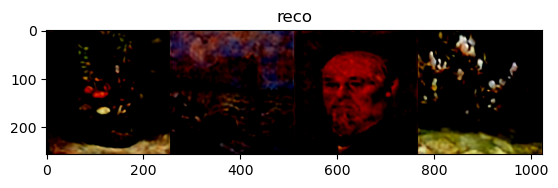

Epoch [4/10], Train Loss: 0.0261, Val Loss: 0.0317, Reg:0.1


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


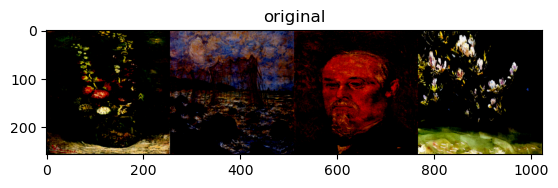

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


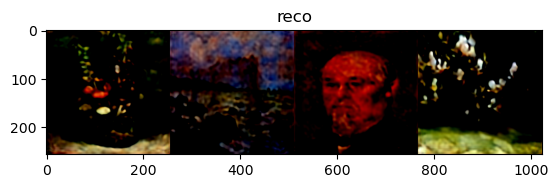

Epoch [5/10], Train Loss: 0.0243, Val Loss: 0.0228, Reg:0.1


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


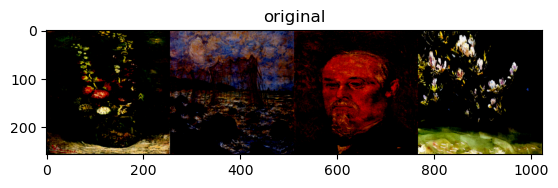

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


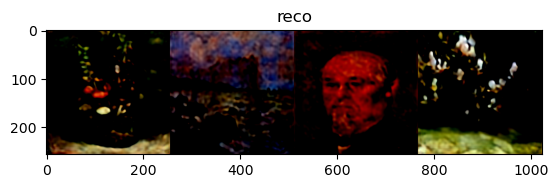

Epoch [6/10], Train Loss: 0.0232, Val Loss: 0.0217, Reg:0.1


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


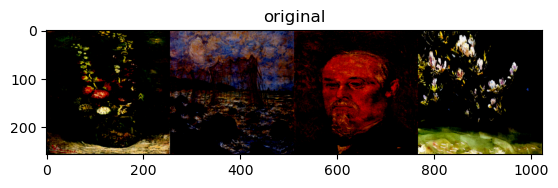

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


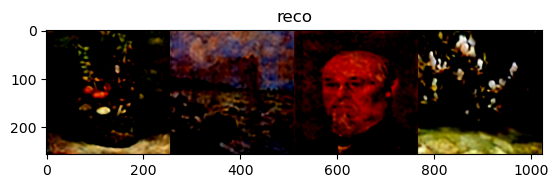

Epoch [7/10], Train Loss: 0.0224, Val Loss: 0.0219, Reg:0.1


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


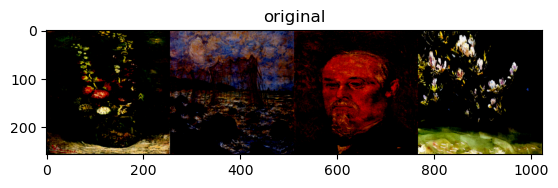

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


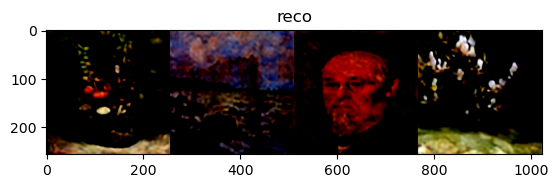

Epoch [8/10], Train Loss: 0.0222, Val Loss: 0.0217, Reg:0.1


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


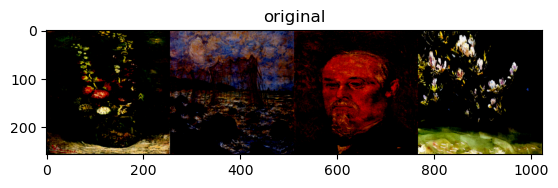

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


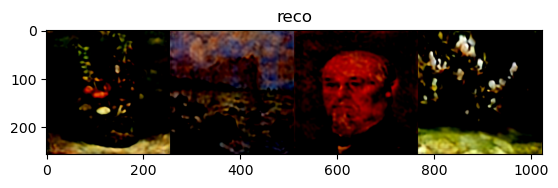

Epoch [9/10], Train Loss: 0.0211, Val Loss: 0.0203, Reg:0.1


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


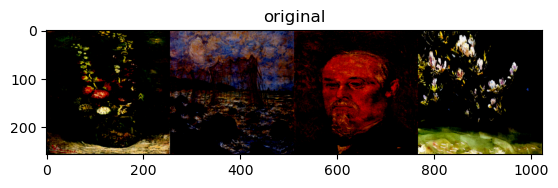

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


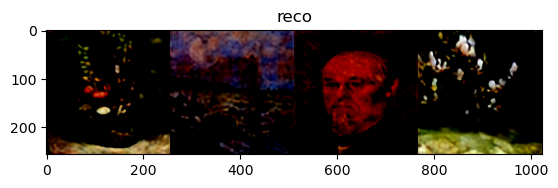

Epoch [10/10], Train Loss: 0.0211, Val Loss: 0.0207, Reg:0.1
Autoencoder training finished.


In [7]:
epochs = 10
train_loss_vals = []
val_loss_vals = []
for epoch in range(epochs):
    running_loss = 0
    for data in train_loader:
        autoencoder.train()
        img, _ = data
        optimizer.zero_grad()
        latent = autoencoder.encode(img.to(device)).latent_dist.sample()
        output = autoencoder.decode(latent).sample
        loss = criterion(output, img.to(device))+latent.abs().mean()*l1_reg
        loss.backward()
        optimizer.step()
        running_loss += loss.item()
    train_loss = running_loss / len(train_loader)
    train_loss_vals.append(train_loss)
    autoencoder.eval()
    running_val_loss = 0
    with torch.no_grad():
        for data in val_loader:
            img, _ = data
            latent = autoencoder.encode(img.to(device)).latent_dist.sample()
            output = autoencoder.decode(latent).sample
            loss = criterion(output, img.to(device)) + latent.abs().mean() * l1_reg
            running_val_loss += loss.item()
        val_loss = running_val_loss / len(val_loader)
        val_loss_vals.append(val_loss)


    plt.imshow(np.hstack(img[0:4].detach().cpu().permute(0,2,3,1).numpy()))
    plt.title('original')
    plt.show()
    plt.imshow(np.hstack(output[0:4].detach().cpu().permute(0,2,3,1).numpy()))
    plt.title('reco')
    plt.show()
    print(f'Epoch [{epoch+1}/{epochs}], Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}, Reg:{l1_reg}')
print('Autoencoder training finished.')

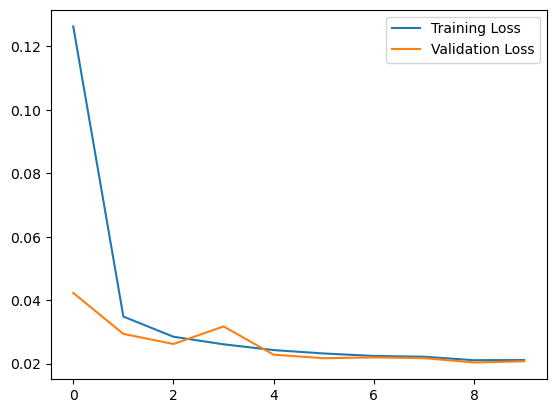

In [8]:
import matplotlib.pyplot as plt
plt.plot(train_loss_vals,label='Training Loss')
plt.plot(val_loss_vals,label='Validation Loss')
plt.legend()
plt.show()

In [18]:
import pandas as pd
df_losses = pd.DataFrame({
    'epoch': np.arange(0,10),
    'train_loss': train_loss_vals,
    'val_loss': val_loss_vals
})
df_losses.to_csv('training_val_loss.csv')

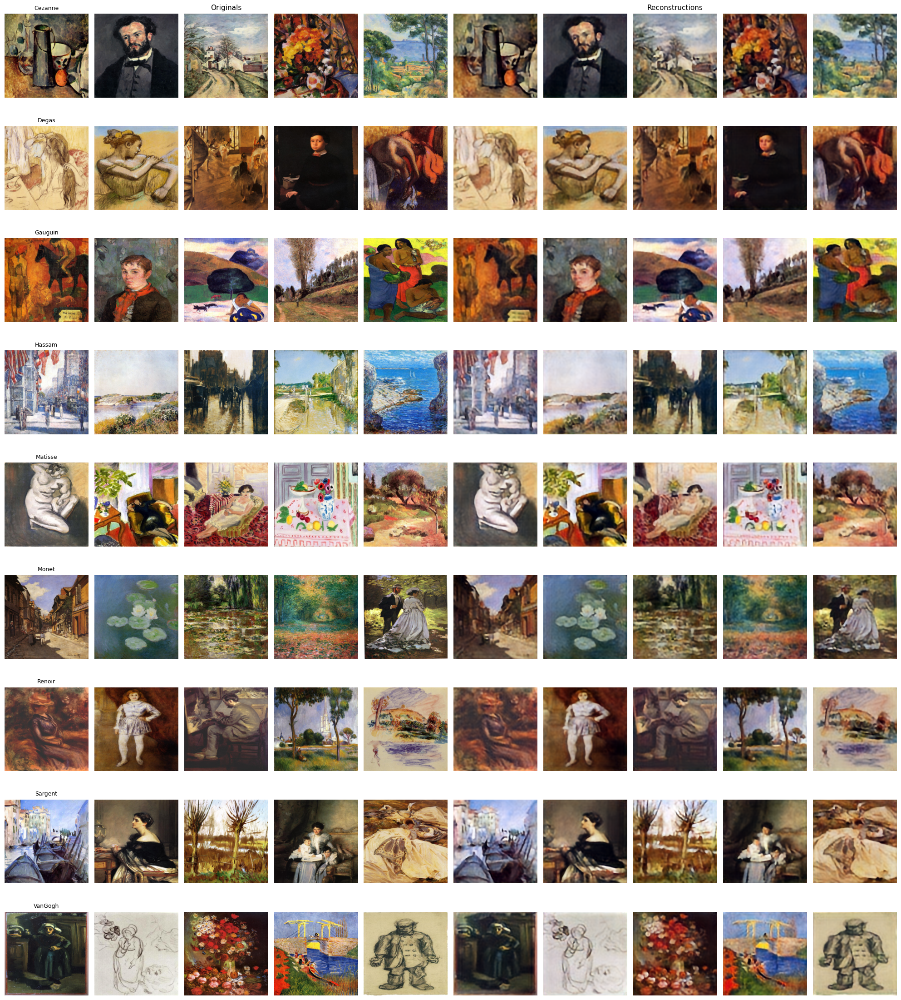

In [17]:
from collections import defaultdict
class_images = defaultdict(list)
class_names = CLASS_NAMES

test_loader_shuffled = torch.utils.data.DataLoader(
    test_loader.dataset, batch_size=test_loader.batch_size, shuffle=True
)

for imgs, labels in test_loader_shuffled:
    for img, label in zip(imgs, labels):
        cls = label
        if len(class_images[cls]) < 5:
            class_images[cls].append(img)
    if all(len(v) == 5 for v in class_images.values()) and len(class_images) == len(class_names):
        break

num_classes = len(class_images)
fig, axes = plt.subplots(num_classes, 10, figsize=(22, num_classes * 2.5))

def denormalize(x):
    return (x * 0.5 + 0.5).clamp(0, 1)

for row, (cls, imgs) in enumerate(sorted(class_images.items())):
    batch = torch.stack(imgs).to(device)
    with torch.no_grad():
        latent = autoencoder.encode(batch).latent_dist.sample()
        recons = autoencoder.decode(latent).sample.cpu()

    for col in range(5):
        axes[row, col].imshow(denormalize(imgs[col]).permute(1, 2, 0).numpy())
        axes[row, col].axis('off')
        axes[row, col + 5].imshow(denormalize(recons[col]).permute(1, 2, 0).numpy())
        axes[row, col + 5].axis('off')

    axes[row, 0].set_title(cls, fontsize=9)
    axes[row, 0].tick_params(left=False)

axes[0, 2].set_title('Originals', fontsize=11)
axes[0, 7].set_title('Reconstructions', fontsize=11)

plt.tight_layout()
plt.subplots_adjust(left=0.1)  # make room for labels
plt.show()

In [13]:
torch.save(autoencoder.state_dict(), 'autoencoder.pth')

In [19]:
# Get final losses
final_train_loss = train_loss_vals[-1]
final_val_loss = val_loss_vals[-1]

# Run test set once
autoencoder.eval()
running_test_loss = 0
with torch.no_grad():
    for data in test_loader:
        img, _ = data
        latent = autoencoder.encode(img.to(device)).latent_dist.sample()
        output = autoencoder.decode(latent).sample
        loss = criterion(output, img.to(device)) + latent.abs().mean() * l1_reg
        running_test_loss += loss.item()
final_test_loss = running_test_loss / len(test_loader)

# Save to df
import pandas as pd
df_losses = pd.DataFrame({
    'split': ['train', 'val', 'test'],
    'loss': [final_train_loss, final_val_loss, final_test_loss]
})
df_losses.to_csv('final_losses.csv', index=False)